In [1]:
import json
import os
import numpy as np
from moviepy.editor import *
from moviepy import *

In [2]:
videos = os.listdir('C:\\Users\\ASUS\\Desktop\\rc11\\SKILL COURSE\\class1\\input_films')

with open('input', 'w') as inputfile:
    for v in videos:
        if v.split('.')[-1] == 'mp4':
            inputfile.write(v+'\n')

In [3]:
%cd video-classification-3d-cnn-pytorch/
%pwd

C:\Users\ASUS\Desktop\rc11\SKILL COURSE\class1\video-classification-3d-cnn-pytorch


'C:\\Users\\ASUS\\Desktop\\rc11\\SKILL COURSE\\class1\\video-classification-3d-cnn-pytorch'

In [4]:
!python main.py --input input --video_root ../input_films --output ../outputfeature.json --model resnet-34-kinetics-cpu.pth --mode feature --no_cuda


loading model resnet-34-kinetics-cpu.pth
../input_films\and-so-years-st-patricks-day-parade-continues-on-schedule.mp4
../input_films\oh-god-s87.mp4


ffmpeg version 4.3.1 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 10.2.1 (GCC) 20200726
  configuration: --disable-static --enable-shared --enable-gpl --enable-version3 --enable-sdl2 --enable-fontconfig --enable-gnutls --enable-iconv --enable-libass --enable-libdav1d --enable-libbluray --enable-libfreetype --enable-libmp3lame --enable-libopencore-amrnb --enable-libopencore-amrwb --enable-libopenjpeg --enable-libopus --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libsrt --enable-libtheora --enable-libtwolame --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libzimg --enable-lzma --enable-zlib --enable-gmp --enable-libvidstab --enable-libvmaf --enable-libvorbis --enable-libvo-amrwbenc --enable-libmysofa --enable-libspeex --enable-libxvid --enable-libaom --enable-libgsm --enable-librav1e --disable-w32threads --enable-libmfx --enable-ffnvcodec --enable-cuda-llvm --enable-cuvid --enable-d3d11va 

In [5]:
file = open('../outputfeature.json')
segments = json.load(file)

In [6]:
len(segments)

2

In [7]:
import numpy as np

In [8]:
for s in segments: print(s['video'])

and-so-years-st-patricks-day-parade-continues-on-schedule.mp4
oh-god-s87.mp4


In [9]:
print(segments[1]['clips'][1].keys())

dict_keys(['segment', 'features'])


In [10]:
ohFeatures = []
for s in segments[1]['clips']:
    ohFeatures.append(np.array(s['features']))  

In [11]:
print(len(ohFeatures))

19


In [12]:
print(len(ohFeatures[1]))

512


In [13]:
xxxFeatures = []
for s in segments[0]['clips']:
    xxxFeatures.append(np.array(s['features']))  

In [14]:
print(len(xxxFeatures))

36


In [15]:
bestRangeStart = 0
bestRangeScore = 100000000

for i in range(len(xxxFeatures) - len(ohFeatures) + 1):
    distance = 0
    for j in range(len(ohFeatures)):
        if i + j < len(ohFeatures):
            d = np.linalg.norm(xxxFeatures[i + j] - ohFeatures[j])
            distance += d
    print(distance)
    if distance < bestRangeScore:
        bestRangeScore = distance
        bestRangeStart = i

369.46164097709084
350.0595556678412
332.2015383801937
315.3522707111261
295.768331811775
276.6720050239587
254.126609730782
234.76953859188038
213.61103144919895
193.435449751204
176.54258750754155
156.67505903200322
133.63832383233998
119.42370773209242
99.1652820632057
78.04730085089554
57.566391320373526
38.3019104216874


In [16]:
bestRangeStart

17

In [17]:
xxxVideo = VideoFileClip(r"../input_films/and-so-years-st-patricks-day-parade-continues-on-schedule.mp4")
tsfps = xxxVideo.fps
tsFrameLength = 1/tsfps

nrFrames = len(ohFeatures)*16
startFrame = bestRangeStart*16

startTime = startFrame*tsFrameLength
endTime = startTime+nrFrames*tsFrameLength

xxxMatchedohVideo = xxxVideo.subclip(startTime,endTime)

In [18]:
startTime

11.344666666666667

In [19]:
endTime

24.024

In [20]:
xxxMatchedohVideo.ipython_display()

Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4


In [22]:
xxxMatchedohVideo.write_videofile("../output_films/KBWithMH.mp4", audio_codec='aac')

Moviepy - Building video ../output_films/KBWithMH.mp4.
MoviePy - Writing audio in KBWithMHTEMP_MPY_wvf_snd.mp4


MoviePy - Done.
Moviepy - Writing video ../output_films/KBWithMH.mp4



Moviepy - Done !
Moviepy - video ready ../output_films/KBWithMH.mp4


In [23]:
xxxMatchedohVideo.duration

12.679333333333334

In [24]:
frame = xxxMatchedohVideo.get_frame(0.5)

In [25]:
from PIL import Image

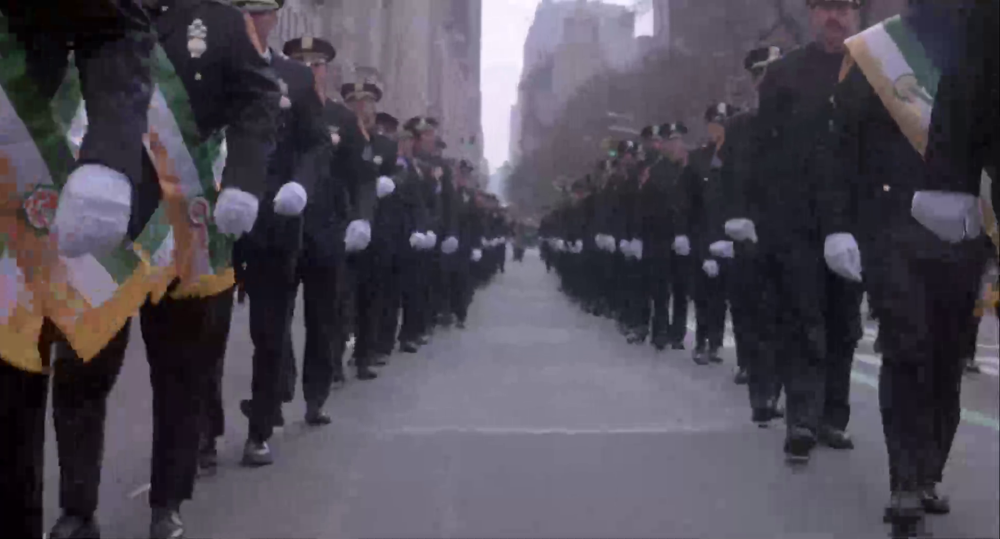

In [26]:
Image.fromarray(frame,'RGB')